http://shuoyang1213.me/WIDERFACE/index.html

In [1]:
from icevision.all import *

/home/ubuntu/anaconda3/envs/ice/lib/python3.9/site-packages/numpy/core/getlimits.py:499: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/home/ubuntu/anaconda3/envs/ice/lib/python3.9/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  return self._float_to_str(self.smallest_subnormal)
/home/ubuntu/anaconda3/envs/ice/lib/python3.9/site-packages/numpy/core/getlimits.py:499: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/home/ubuntu/anaconda3/envs/ice/lib/python3.9/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  return self._float_to_str(self.smallest_subnormal)
INFO     - The mmdet config folder already exists. No need to download

In [2]:
import scipy.io
import os
import pandas as pd

class FaceParser(Parser):
    def __init__(self, template_record, data_dir, anns_file):
        super().__init__(template_record=template_record)
        
        self.data_dir = data_dir
        self.anns = scipy.io.loadmat(anns_file)

        folders = [x[0].split('--')[1] for x in os.walk(data_dir) if '--' in x[0] and 'people' not in x[0]]
        folders.sort()
        files = [n[0][0] for f in self.anns["file_list"] for n in f[0]]
        boxes = [n[0] for f in self.anns["face_bbx_list"] for n in f[0]]
        invalid = [n[0] for f in self.anns["invalid_label_list"] for n in f[0]]
        self.df = pd.DataFrame({"filename": files, "bbox": boxes, "invalid": invalid})
        self.df["directory"] = self.df.filename.apply(lambda x: x.split("_")[0]+"--"+self.get_folder(x, folders))
        self.df = self.df.sample(1000, random_state=0)

        self.class_map = ClassMap(["face"])

    def get_folder(self, s, folders):
        for f in folders:
            if f in s:
                return f    
        return 'people--driving--car'

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.filename

    def image_width_height(self, o) -> Tuple[int, int]:
        return get_img_size(self.data_dir / o.directory / (o.filename+".jpg"))

    def parse_fields(self, o, record, is_new):
        if is_new:
            record.set_filepath(self.data_dir / o.directory / (o.filename+".jpg"))
            record.set_img_size(self.image_width_height(o))
            record.detection.set_class_map(self.class_map)

        for box, invalid in zip(o.bbox, o.invalid):
            if invalid[0] == 0:
                record.detection.add_bboxes([BBox.from_xywh(*box)])
                record.detection.add_labels(["face"])

In [3]:
template_record = ObjectDetectionRecord()
data_dir = Path('/home/ubuntu/data/WIDER_train/images')
anns_file = Path('/home/ubuntu/data/wider_face_split/wider_face_train.mat')
parser = FaceParser(template_record, data_dir, anns_file)

train_records, valid_records = parser.parse()#cache_filepath= data_dir / "faces.pkl")

  0%|          | 0/1000 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/1000 [00:00<?, ?it/s]

AUTOFIX-FAIL - (record_id: 36_Football_Football_36_63) - Cannot auto-fix coordinates: <BBox (xmin:713, ymin:34, xmax:714, ymax:34)>
	y_min:34 is greater than or equal to y_max:34 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 36_Football_Football_36_63) Removed annotation with index: 4, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:45
AUTOFIX-FAIL - (record_id: 2_Demonstration_Demonstrators_2_373) - Cannot auto-fix coordinates: <BBox (xmin:770, ymin:3, xmax:770, ymax:4)>
	x_min:770 is greater than or equal to x_max:770 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 2_Demonstration_Demonstrators_2_373) Removed annotation with index: 10, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:45


In [4]:
len(train_records), len(valid_records)

(800, 200)

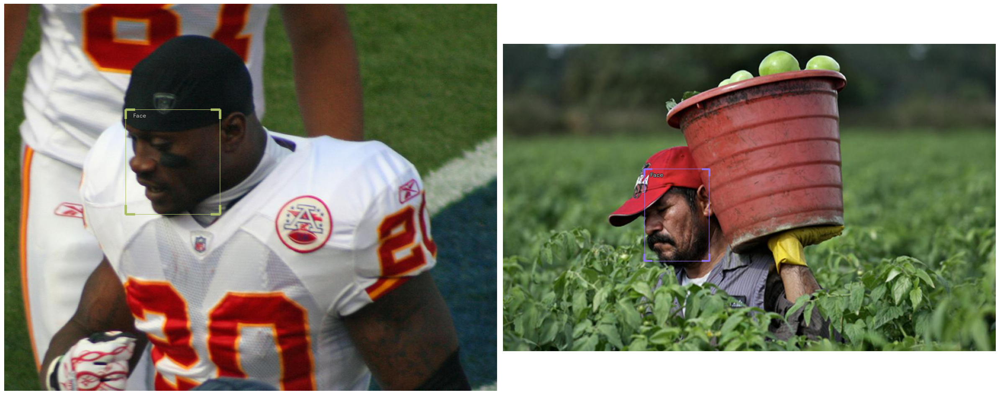

In [5]:
show_records(random.sample(list(valid_records), 2), class_map=parser.class_map, ncols=2)

In [6]:
base_path = Path('/home/ubuntu/data/neuralmagic_faces')

for split in ["train", "valid"]:
    for fold in ["images", "labels"]:
        (base_path / split / fold).mkdir(parents=True, exist_ok=True)

In [7]:
import shutil

def save_img_and_label(rec, split):
    try:
        img_w, img_h, orig_fname = rec.common.width, rec.common.height, rec.filepath
        img_fname = base_path / split / "images" / rec.filepath.name
        label_fname = base_path / split / "labels" / (rec.filepath.stem+".txt")
        shutil.copyfile(orig_fname, img_fname)

        labels = []
        for bbox in rec.detection.bboxes: labels.append((0, *bbox.relative_xcycwh(img_w, img_h)))

        pd.DataFrame(labels).to_csv(label_fname, sep=" ", index=False, header=None)
        with open(label_fname, 'r+') as f:
            f.seek(0,2)                    
            size=f.tell()               
            f.truncate(size-1)

        return img_fname, label_fname, labels
    except:
        print(rec)

In [8]:
#np.random.seed(0)

#np.random.shuffle(list(train_records))
#np.random.shuffle(list(valid_records))

#train_recs_sample = train_records[:200]
#valid_recs_sample = valid_records[:50]
print(len(train_records), len(valid_records))

for rec in train_records: _ = save_img_and_label(rec, "train")
for rec in valid_records: _ = save_img_and_label(rec, "valid")

800 200


In [9]:
!ls /home/ubuntu/data/neuralmagic_faces/train/images/ | wc -l
!ls /home/ubuntu/data/neuralmagic_faces/train/labels/ | wc -l

!ls /home/ubuntu/data/neuralmagic_faces/valid/images/ | wc -l
!ls /home/ubuntu/data/neuralmagic_faces/valid/labels/ | wc -l

800
800
200
200


In [10]:
# d = aggregate_records_objects(train_records)

# df = pd.DataFrame(d["common"]["img_size"])
# df.describe()

In [11]:
# df = pd.DataFrame(d["common"]["img_size"])
# df.describe()

In [12]:
# df = pd.DataFrame(d["detection"]["bboxes"])
# df.bbox_sqrt_area.describe()

In [13]:
# df.bbox_sqrt_area.describe()

In [14]:
# pd.DataFrame(d["detection"]["bboxes"]).bbox_sqrt_area.describe()

In [15]:
# 60 * 1.5

# x1 = 5-5*.15
# x2 = 10*1.15

# x2 - x1, 5*1.5, 5-5*.5, 8/5 -1

In [16]:
presize = 960
size = 768
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size, presize=presize, shift_scale_rotate=None), 
                             tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size), tfms.A.Normalize()])
#train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size, presize=presize), tfms.A.Normalize()])

train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

len(train_ds), len(valid_ds)

(800, 200)

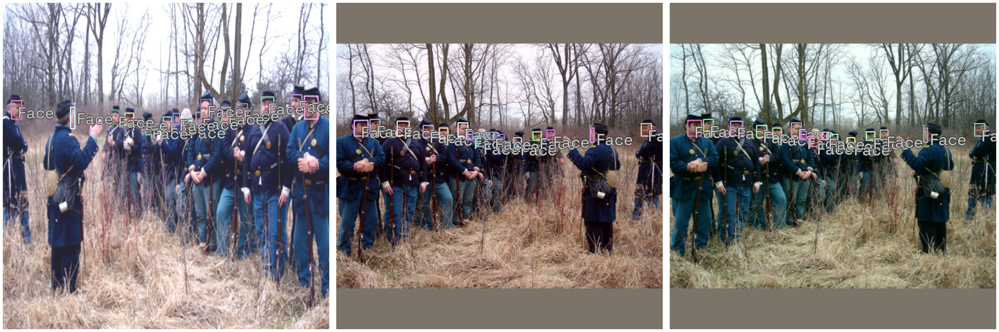

In [17]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[1] for _ in range(3)]
show_samples(samples, ncols=3)

In [18]:
#model_type = models.torchvision.faster_rcnn
model_type = models.ultralytics.yolov5
#model_type = models.ross.efficientdet

In [19]:
# import multiprocessing
# multiprocessing.cpu_count()

In [20]:
bs = 24
train_dl = model_type.train_dl(train_ds, batch_size=bs, num_workers=8, shuffle=False)
valid_dl = model_type.valid_dl(valid_ds, batch_size=bs, num_workers=8, shuffle=False)

/home/ubuntu/anaconda3/envs/ice/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [21]:
(x, y), recs = first(train_dl)
x.shape, y.shape

(torch.Size([24, 3, 768, 768]), torch.Size([191, 6]))

In [18]:
#backbone.pretrained

In [19]:
#backbone = model_type.backbones.tf_d0()
#model = model_type.model(backbone=backbone, num_classes=parser.class_map.num_classes, img_size=size)

In [20]:
# dl = model_type.valid_dl(valid_ds, batch_size=2, num_workers=2, shuffle=False)
# batch = first(dl)
# model_type.show_batch(batch, ncols=2)

In [ ]:
backbone = model_type.backbones.small(pretrained=True)
#backbone = model_type.backbones.medium(pretrained=True)
#backbone = model_type.backbones.large(pretrained=True)

model = model_type.model(backbone=backbone, num_classes=parser.class_map.num_classes, 
                         img_size=size, device=torch.device("cuda"))

In [22]:
#model = model_type.model(num_classes=parser.class_map.num_classes)

In [23]:
from fastai.callback.tracker import SaveModelCallback

metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]
cbs = SaveModelCallback(monitor='COCOMetric', fname="yolo_small")

learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics, cbs=cbs)

SuggestedLRs(valley=0.004365158267319202)

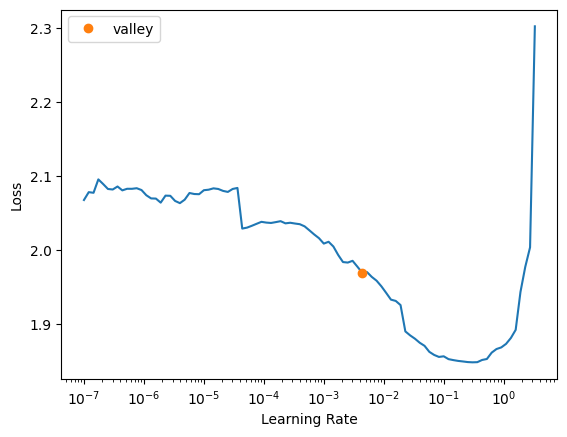

In [24]:
learn.lr_find()

In [25]:
#learn.fine_tune(epochs=50, base_lr=3e-4, freeze_epochs=5)

In [25]:
learn.fit_one_cycle(20, 5e-3)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.871756,1.754412,0.000325,00:40
1,1.711414,1.558220,0.004372,00:38
2,1.538652,1.363311,0.024874,00:38
3,1.387184,1.327097,0.041562,00:39
4,1.284302,1.253814,0.067566,00:38
5,1.197166,1.145709,0.130246,00:38
6,1.131570,1.084846,0.134952,00:40
7,1.085483,1.058357,0.158032,00:38
8,1.043458,1.035315,0.173830,00:38
9,1.012790,0.996907,0.189835,00:39


/home/ubuntu/anaconda3/envs/ice/lib/python3.9/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Better model found at epoch 0 with COCOMetric value: 0.00032477066132815196.
Better model found at epoch 1 with COCOMetric value: 0.0043723057909889.
Better model found at epoch 2 with COCOMetric value: 0.024874334572901783.
Better model found at epoch 3 with COCOMetric value: 0.041561506903198625.
Better model found at epoch 4 with COCOMetric value: 0.06756561699269632.
Better model found at epoch 5 with COCOMetric value: 0.13024614454008013.
Better model found at epoch 6 with COCOMetric value: 0.13495230633829366.
Better model found at epoch 7 with COCOMetric value: 0.15803218682426864.
Better model found at epoch 8 with COCOMetric value: 0.17383048520899474.
Better model found at epoch 9 with COCOMetric value: 0.18983505630336245.
Better model found at epoch 11 with COCOMetric value: 0.20390602996267781.
Better model found at epoch 12 with COCOMetric value: 0.21549552156119522.
Better model found at epoch 13 with COCOMetric value: 0.2222508235765203.
Better model found at epoch 14 w

<AxesSubplot:>

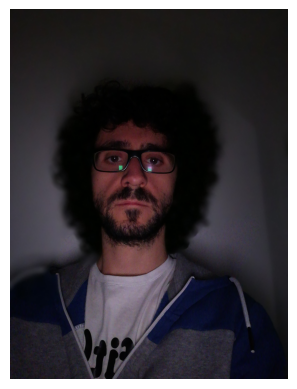

In [2]:
infer_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(768), tfms.A.Normalize()])

import PIL
def get_image(p):
    img = PIL.Image.open(p)
    return np.array(img)

imgs = [get_image(f"./testfaces/fraface{i}.jpeg") for i in range(1, 8)]

show_img(random.sample(imgs, 1)[0])

In [ ]:
model_type = models.ultralytics.yolov5
backbone = model_type.backbones.small(pretrained=True)
model = model_type.model(backbone=backbone, num_classes=2, 
                         img_size=768, device=torch.device("cpu"))

model.load_state_dict(torch.load('./models/yolo_small.pth'))

/home/ubuntu/anaconda3/envs/ice/lib/python3.9/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


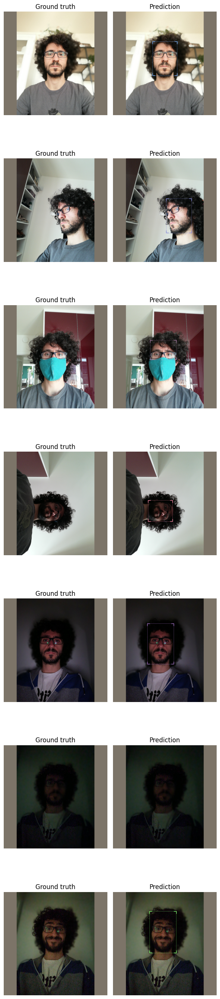

In [4]:
infer_ds = Dataset.from_images(imgs, infer_tfms)
preds = model_type.predict(model, infer_ds, keep_images=True)
show_preds(preds=preds)